<a href="https://colab.research.google.com/github/ismailerbas/Projects-in-Machine-Learning-and-AI/blob/main/homework_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The Problem


When the first coronavirus case, began to spread rapidly around the world, the World Health Organization (WHO) declared it a public health emergency of international concern. After the corona virus was labeled as a pandemic, in this worldwide health crisis, researchers, medical professionals and the medical industry began to search for new technological solutions to monitor and control the spread of the Covid-19 pandemic, diagnose the disease, and develop vaccines and drugs. At this point, artificial intelligence as a medical tool has been a helpful factor in fighting the corona virus. Here we will differantiate covid from normal lungs by using chest xray images. The dataset link is : https://www.kaggle.com/datasets/alifrahman/covid19-chest-xray-image-dataset

Setting up Libraries

In [5]:
# import required libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,precision_score,f1_score,recall_score
from sklearn.metrics import f1_score
from sklearn.preprocessing import Normalizer
import warnings
import tensorflow as tf
warnings.filterwarnings("ignore")
import os 
import keras 
from keras.models import Sequential, load_model
from keras.layers import Dense,Dropout,LSTM,SimpleRNN,GRU, Conv2D, MaxPooling2D, Normalization
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.datasets import make_classification
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Activation, Dropout,Dense, Flatten, BatchNormalization, Conv2D, MaxPooling2D, Lambda, Input, AveragePooling2D
from keras.callbacks import ReduceLROnPlateau, LearningRateScheduler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from imutils import paths
import random
import shutil
import cv2
import matplotlib.image as mpimg
%matplotlib inline


The data


In [16]:
dataset = "/content/drive/My Drive/mlp/dataset" # I downloaded the dataset to my google drive to use it more easily


In [ ]:
# We will visualize some of the images next

In [ ]:
fig = plt.figure()      # Here we will create a figure and show 4 images of normal lungs
fig.suptitle('normal')
f, axarr = plt.subplots(4,1) 
k=0
# We will use glob library to import whole folder 
for img_path in glob.glob(dataset + '/normal/*'):
  if k<4:
    axarr[k].imshow(mpimg.imread(img_path))
    k=k+1
  
fig = plt.figure()      # Here we will create a figure and show 4 images of lungs with covid 
fig.suptitle('covid')
f, axarr = plt.subplots(4,1) 
k=0
# We will use glob library to import whole folder 
for img_path in glob.glob(dataset + '/covid/*'):
  if k<4:
    axarr[k].imshow(mpimg.imread(img_path))
    k=k+1
  


In [4]:
# Here we will seperate merge the dataset and their labels respectively. By doing this we can split the dataset into training and test sets 
# and we can use stratify to divide the dataset by keeping the proportions
imagePaths = list(paths.list_images(dataset))
data = []
labels = []
for imagePath in imagePaths:
    label = imagePath.split(os.path.sep)[-2]
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Here we change the color channels from BGR to RGB for consistency
    image = cv2.resize(image, (300, 300)) # We resize the image to 300x300 pixels. The shapes of the images are different from each other as we can see above and this fixes the image sizes. 
    data.append(image)
    labels.append(label)    # We save the class labels for training 
data = np.array(data) / 255.0   # Here we normalize the image and we change it to np array for more efficient use
labels = np.array(labels) 

In [5]:
data.shape # As we can see here we have 94 images in total and their shape is 300x300 with RGB channels

(94, 300, 300, 3)

In [6]:
lb = LabelBinarizer()  # Right now the labes are covid and normal so we are going to make them 0 for normal and 1 for covid so that the model can understand it better
print(labels)
labels = lb.fit_transform(labels)
print(labels)
labels = to_categorical(labels)
print(labels)
# Here we split the dataset into train and test set by keeping the proportions using stratify
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size=0.20, stratify=labels, random_state=42) 


In [7]:
trainX.shape # After division we can see that we have 75 images for training and 19 for test

(75, 300, 300, 3)

In [29]:
# Here we define CNN model using convolutional layers and max pooling layers. At the end we use flatten to convert from 2D to 1D and use dense layers
model=tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3),activation='relu',input_shape=(300,300,3)), # I used relu as activation functions for the layers
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128,activation='relu'), 
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2,activation='softmax') # I used softmax layer here because it is a classification task.
])

In [32]:
model.compile(loss='binary_crossentropy',                       # Because it is a binary classification, I use binary crossentropy for loss funtion and model will use accuracy as a metric
              optimizer=tf.keras.optimizers.Adam(lr=1e-3), # I use Adam for optimizer and set learning rate to 1e-3 after tuning period
              metrics=['accuracy'])
earlyStopping = EarlyStopping(monitor='val_loss',  # We will use early stopping to the model for preventing overfitting
                              patience = 5, # The patience value means that the model will stop if the validation loss repeats 5 times.
                              verbose = 0,
                              mode = 'auto')

callback = [
  
    [earlyStopping]
]

In [33]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 298, 298, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 149, 149, 32)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 147, 147, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 73, 73, 64)       0         
 2D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 341056)            0         
                                                                 
 dense_6 (Dense)             (None, 128)              

In [37]:
history=model.fit(trainX, trainY,
          validation_split=0.2, # We split the training data by 80% train and 20% validation
          batch_size=32, epochs=30, verbose=1, shuffle=True) # I choose the batch size 32.
          #  Here I defined 30 epochs but it might stop at some point before 

Epoch 1/30
2/2 [==============================] - 9s 5s/step - loss: 0.0121 - accuracy: 1.0000 - val_loss: 0.3491 - val_accuracy: 0.9333
Epoch 2/30
2/2 [==============================] - 9s 4s/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 0.2874 - val_accuracy: 0.9333
Epoch 3/30
2/2 [==============================] - 11s 4s/step - loss: 9.3031e-04 - accuracy: 1.0000 - val_loss: 0.2445 - val_accuracy: 0.9333
Epoch 4/30
2/2 [==============================] - 9s 4s/step - loss: 0.0117 - accuracy: 1.0000 - val_loss: 0.2285 - val_accuracy: 0.9333
Epoch 5/30
2/2 [==============================] - 9s 5s/step - loss: 0.0219 - accuracy: 0.9833 - val_loss: 0.2347 - val_accuracy: 0.9333
Epoch 6/30
2/2 [==============================] - 9s 4s/step - loss: 3.4426e-04 - accuracy: 1.0000 - val_loss: 0.3076 - val_accuracy: 0.9333
Epoch 7/30
2/2 [==============================] - 10s 6s/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.3695 - val_accuracy: 0.9333
Epoch 8/30
2/2 [===============

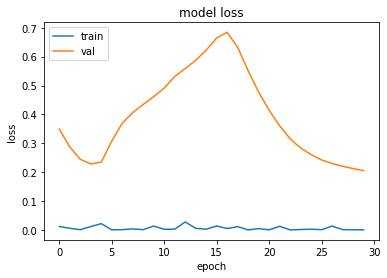

In [54]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# We can see that the cnn overfits by looking to the losses. 

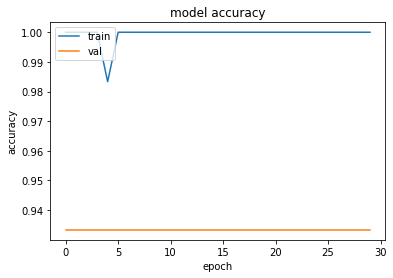

In [55]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# We can see that the accuracy of the train set is 100 and it is 100 from the beginning this is an indication of overfitting, model will probably won't perform as good as training for test set.  

In [ ]:
prediction=model.predict(testX)
prediction = np.argmax(prediction ,axis =1)
testy=np.argmax(testY ,axis =1)

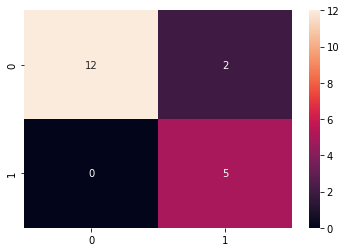

In [52]:
import seaborn as sns
confusion_matrix = confusion_matrix(testy, prediction)
sns.heatmap(confusion_matrix, annot = True)

In [59]:
scores = accuracy_score(testy, prediction)
print('The accuracy is %.2f' % (scores*100))
precision = precision_score(testy, prediction)

print('The  precision is %.2f' % (precision*100))
f1 = f1_score(testy, prediction)

print('The  f1 score is %.2f' % (f1*100))
recall= recall_score(testy, prediction)

print('The  recall score is %.2f' % (f1*100))

The accuracy is 89.47
The  precision is 71.43
The  f1 score is 83.33
The  recall score is 83.33


In [ ]:
# As we predicted the model is not as good as predicting classes in training and validation sets. There are several factors that can cause problem with model learning. 
# The image is reshaped and we might be loosing some information by reshaping it. The amount of images are 75 for the training set and we are dividing 20% of it to validation. So the amount is too small for the model to learn truly. 
# This can be improved getting more images from covid patients, but in general, medical datasets are small and very hard to get new ones. We can generate new images using augmentation methods, Gans, or vaes.
# We can improve the model by one of the using transfer learning models. Which can be an improvement but dataset is still too small for this.  

In [ ]:
# Next we try the transfer learning model Inception V3 and we will see how using this model improves the model performance

In [86]:
model = Sequential()

pretrained_model= tf.keras.applications.InceptionV3(weights="imagenet", include_top=False, input_tensor=Input(shape=(300, 300, 3))) # Here we define the model and remove the classifier part of the model by using "include_top=False", and we will specify out dataset image size 300×300.
for layer in pretrained_model.layers: # Here we will freeze the layer weights
        layer.trainable=False

model.add(pretrained_model)

87910968/87910968 [==============================] - 1s 0us/step


In [87]:
model.add(Flatten()) # After that we define the layers for our model after the InceptionV3, I added two dense layers as we did above for the cnn model
model.add(Dense(512, activation='relu'))
model.add(Dense(2, activation='softmax'))

In [88]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 flatten_9 (Flatten)         (None, 131072)            0         
                                                                 
 dense_18 (Dense)            (None, 512)               67109376  
                                                                 
 dense_19 (Dense)            (None, 2)                 1026      
                                                                 
Total params: 88,913,186
Trainable params: 67,110,402
Non-trainable params: 21,802,784
_________________________________________________________________


In [ ]:
# We can see the full summary of our model above.

In [89]:
model.compile(loss='binary_crossentropy', # As cnn model we use binary crossentropy for loss function and we can measure the model's performance using accuracy
              optimizer=tf.keras.optimizers.Adam(lr=1e-3), # We will use Adam optimizer and learning rate of 1e-3
              metrics=['accuracy'])
earlyStopping = EarlyStopping(monitor='val_loss', 
                              patience = 5, 
                              verbose = 0,
                              mode = 'auto')
modelCheckPoint = ModelCheckpoint(filepath='model.h5', 
                                  monitor='val_loss', 
                                  save_best_only=True, 
                                  verbose=0)
callback = [
  
    [earlyStopping,modelCheckPoint]
] # We use earlystopping for prevention to overfitting and we will use modelcheckpoint to save the best model

In [92]:
history=model.fit(trainX, trainY,
          validation_split=0.2, # We split the training data by 80% train and 20% validation
          batch_size=32, epochs=30, verbose=1, shuffle=True) # I choose the batch size 32  
          # Another hyperparameter is number of epechs which can be optimized with early stopping. Here I defined 30 epochs but it might stop at some point.

Epoch 1/30
2/2 [==============================] - 25s 11s/step - loss: 29.5134 - accuracy: 0.6833 - val_loss: 41.6762 - val_accuracy: 0.6667
Epoch 2/30
2/2 [==============================] - 19s 11s/step - loss: 10.1545 - accuracy: 0.8667 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 3/30
2/2 [==============================] - 21s 14s/step - loss: 0.4266 - accuracy: 1.0000 - val_loss: 1.3321e-17 - val_accuracy: 1.0000
Epoch 4/30
2/2 [==============================] - 19s 11s/step - loss: 2.2811 - accuracy: 0.9500 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 5/30
2/2 [==============================] - 16s 10s/step - loss: 1.3480e-23 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 6/30
2/2 [==============================] - 17s 10s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 7/30
2/2 [==============================] - 19s 10s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accur

In [93]:
model.summary() # we can see the model here and we can see all the layers that we defined

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 flatten_9 (Flatten)         (None, 131072)            0         
                                                                 
 dense_18 (Dense)            (None, 512)               67109376  
                                                                 
 dense_19 (Dense)            (None, 2)                 1026      
                                                                 
Total params: 88,913,186
Trainable params: 67,110,402
Non-trainable params: 21,802,784
_________________________________________________________________


In [94]:
# We can see that the rnn predicted the future test data very good and the error is low but we can decrease the error by using more better models like lstm and gru

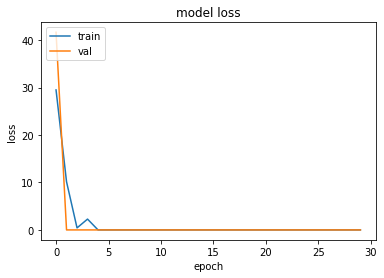

In [95]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

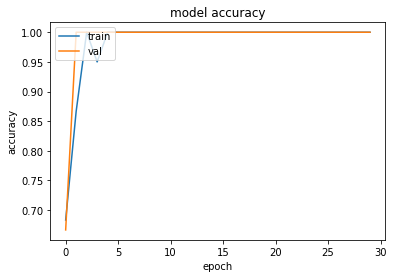

In [96]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# we can see that the loss and mae is following almost the same trend and we can see that they are low.

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
prediction=model.predict(testX)
prediction = np.argmax(prediction ,axis =1)
testy=np.argmax(testY ,axis =1)
confusion_matrix = confusion_matrix(testy, prediction)


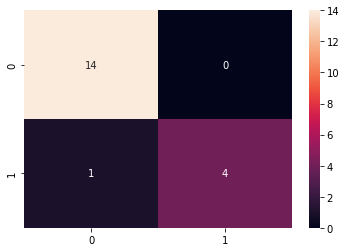

In [98]:
import seaborn as sns
sns.heatmap(confusion_matrix, annot = True)

In [100]:
scores = accuracy_score(testy, prediction)
print('The accuracy is %.2f' % (scores*100))
precision = precision_score(testy, prediction)

print('The  precision is %.2f' % (precision*100))
f1 = f1_score(testy, prediction)

print('The  f1 score is %.2f' % (f1*100))
recall= recall_score(testy, prediction)

print('The  recall score is %.2f' % (f1*100))

The accuracy is 94.74
The  precision is 100.00
The  f1 score is 88.89
The  recall score is 88.89


In [ ]:
# We can see that the model performs better using pre-trained model and gives 95% accuracy.However because the data is not much there might not be too many bias in the data so for generalization we shouldn't trust these results. 
# Overall we see the power of transfer learning. Instead of using random weights we are using pre-trained weights on variety of different images that we wouldn't be able to train by ourselves. 

Data Augmentation


In [18]:
# Here we will use the data augmentation method to increase the amount of images in our dataset. We will flip and rotate the images randomly and test it using the same models.
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomTranslation

data_augmentation = tf.keras.Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2)
])

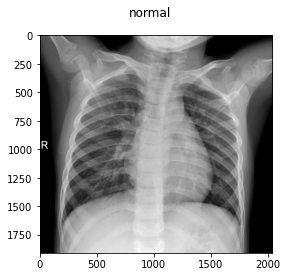

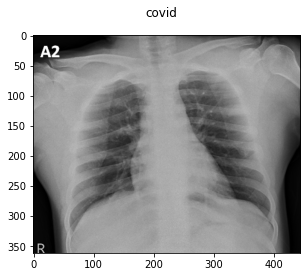

In [ ]:
# Here we will use glob to get the images in the folders and append them into the respective arrays. 
normal_images = []
for img_path in glob.glob(dataset + '/normal/*'):
    normal_images.append(mpimg.imread(img_path))  

fig = plt.figure()
fig.suptitle('normal')
plt.imshow(normal_images[0], cmap='gray') 

covid_images = []
for img_path in glob.glob(dataset + '/covid/*'):
    covid_images.append(mpimg.imread(img_path))

fig = plt.figure()
fig.suptitle('covid')
plt.imshow(covid_images[0], cmap='gray')

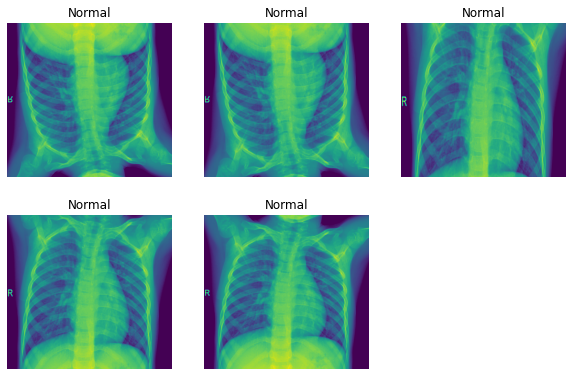

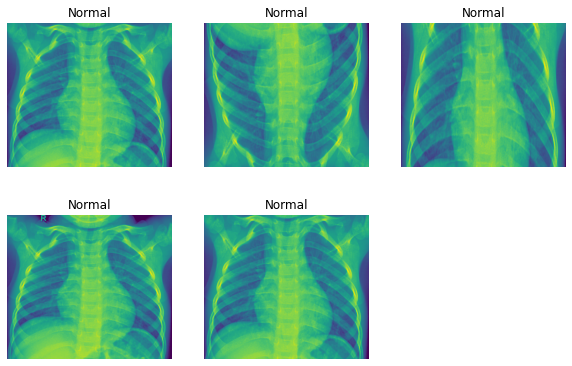

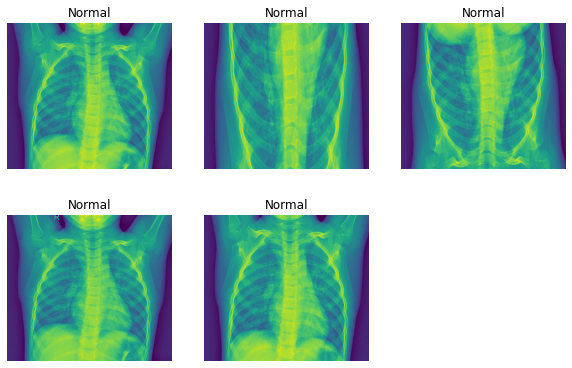

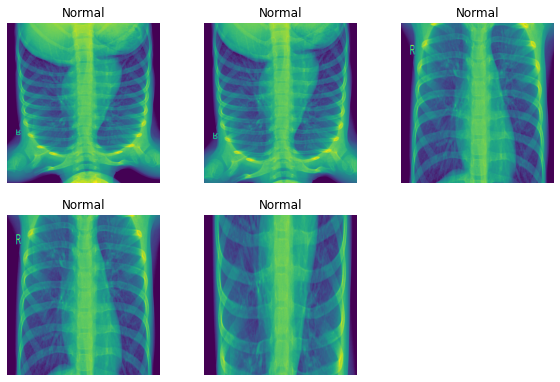

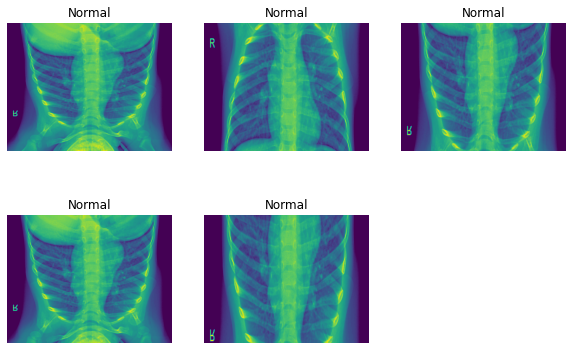

...

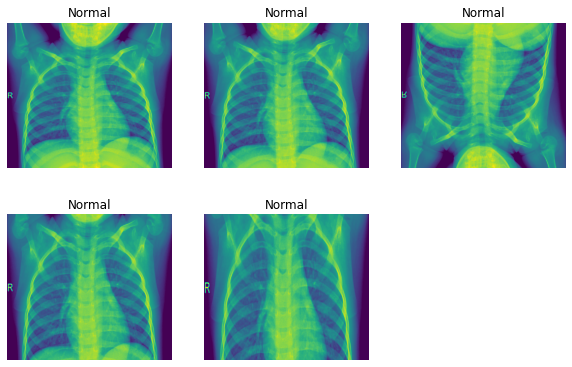

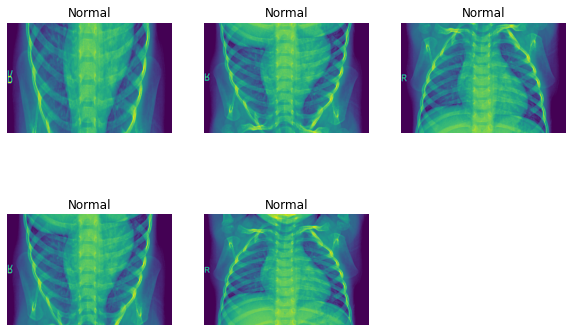

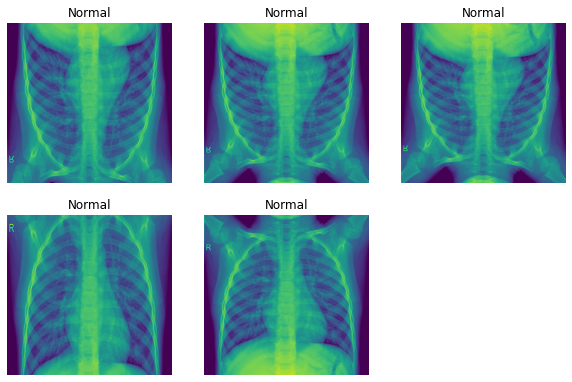

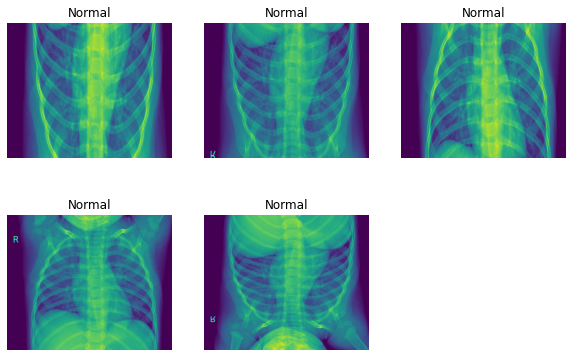

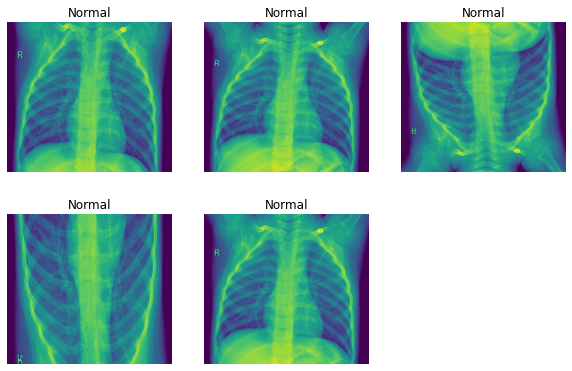

In [21]:
augmented_images=[]
from PIL import Image
k=0
for images in normal_images: # we will use a for loop here to use all the images in normal images and while doing that we will plot the images. 
    plt.figure(figsize=(10, 10))
    first_image = images
    
    for i in range(5):
        ax = plt.subplot(3, 3, i + 1)
        augmented_images = data_augmentation(
            tf.expand_dims(first_image, 0), training=True
        )
        im = Image.fromarray(np.asarray(augmented_images[0]))
        im.save("/content/drive/My Drive/mlp/dataset_augmented/normal/"+str(k)+".jpeg")
        plt.imshow(augmented_images[0])
        k=k+1
        plt.title("Normal")
        plt.axis("off")

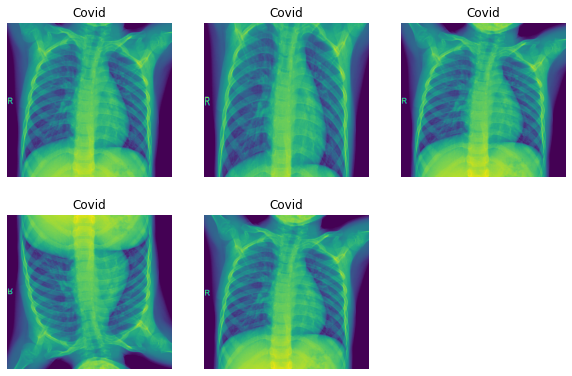

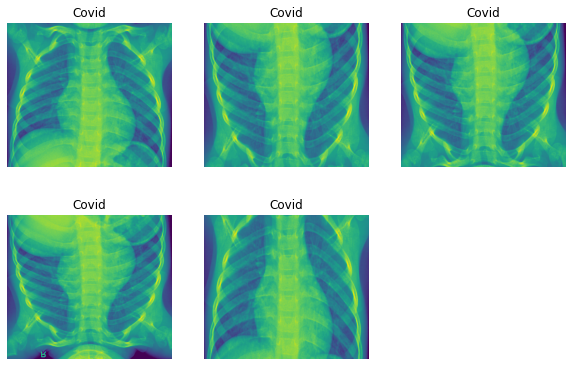

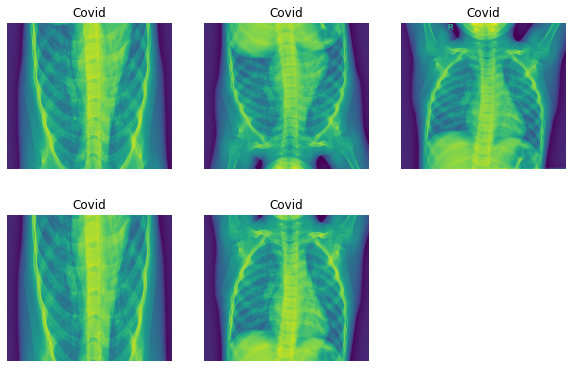

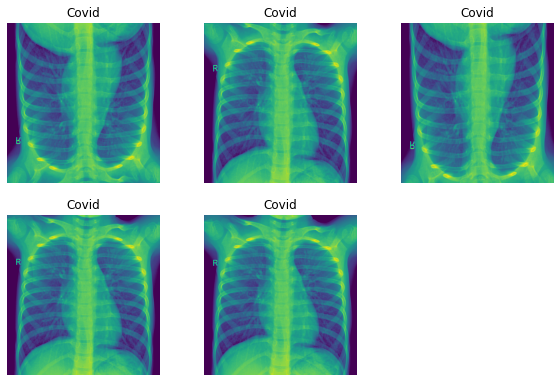

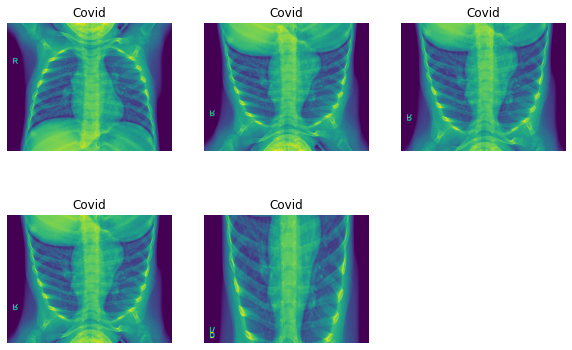

...

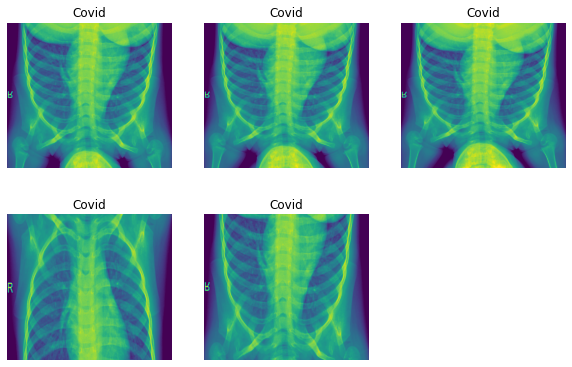

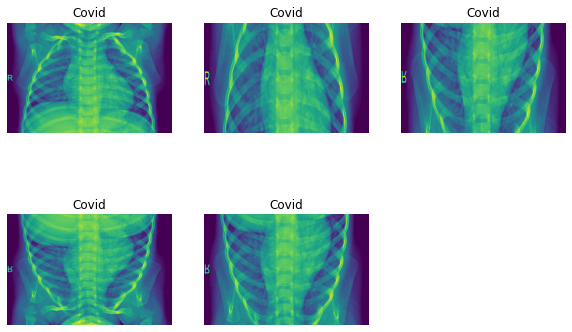

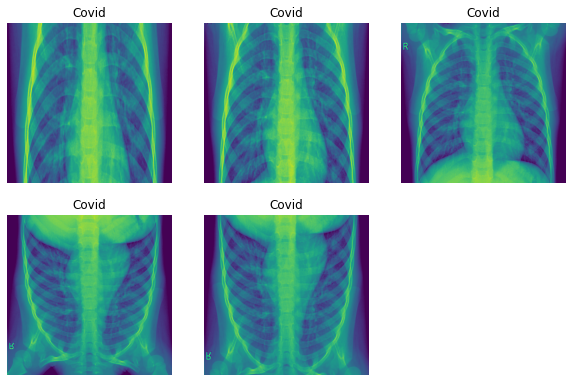

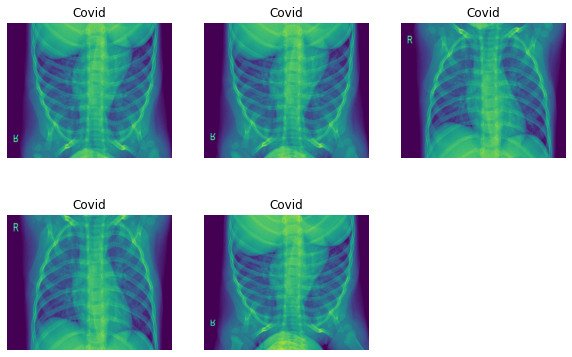

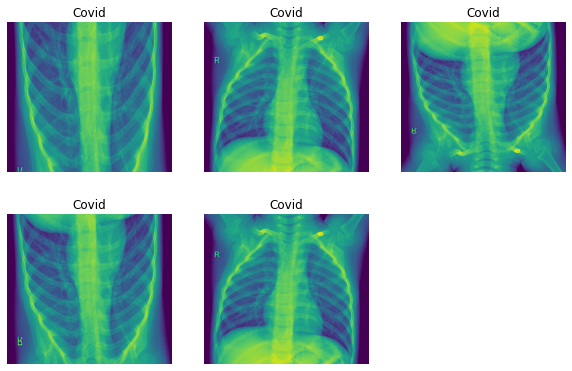

In [23]:
augmented_covid_images=[]

k=0
for images in normal_images:
    plt.figure(figsize=(10, 10))
    first_image = images
    
    for i in range(5):
        ax = plt.subplot(3, 3, i + 1)
        augmented_images = data_augmentation(
            tf.expand_dims(first_image, 0), training=True
        )
        im = Image.fromarray(np.asarray(augmented_images[0]))
        im=im.convert('RGB')
        im.save("/content/drive/My Drive/mlp/dataset_augmented/covid/"+str(k)+".jpeg")
        plt.imshow(augmented_images[0])
        k=k+1
        plt.title("Covid")
        plt.axis("off")

In [ ]:
# We can see the results above. The images are rotated and for medical images usually this method won't be as effective as we wanted. However we will try the performance next.

In [24]:
dataset_augmented = "/content/drive/My Drive/mlp/dataset_augmented"

In [25]:
imagePaths = list(paths.list_images(dataset_augmented))
# Here we will seperate merge the dataset and their labels respectively. By doing this we can split the dataset into training and test sets 
# and we can use stratify to divide the dataset by keeping the proportions
data = []
labels = []
for imagePath in imagePaths:
    label = imagePath.split(os.path.sep)[-2]
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Here we change the color channels from BGR to RGB for consistency
    image = cv2.resize(image, (300, 300)) # We resize the image to 300x300 pixels. The shapes of the images are different from each other as we can see above and this fixes the image sizes. 
    data.append(image)
    labels.append(label)    # We save the class labels for training 
data = np.array(data) / 255.0   # Here we normalize the image and we change it to np array for more efficient use
labels = np.array(labels) 

In [26]:
data.shape # We can see that we generated 250 images with shape of 300x300 pixels and 3 channels

(250, 300, 300, 3)

In [27]:
lb = LabelBinarizer()  # Right now the labes are covid and normal so we are going to make them 0 for normal and 1 for covid so that the model can understand it better
print(labels)
labels = lb.fit_transform(labels)
print(labels)
labels = to_categorical(labels)
print(labels)
# Here we split the dataset into train and test set by keeping the proportions using stratify
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size=0.20, stratify=labels, random_state=42) 


In [28]:
trainX.shape # We divided the dataset into train and test and we can see that we have 200 images for training

(200, 300, 300, 3)

In [29]:
# Here we define CNN model using convolutional layers and max pooling layers. At the end we use flatten to convert from 2D to 1D and use dense layers
model=tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3),activation='relu',input_shape=(300,300,3)), # I used relu as activation functions for the layers
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128,activation='relu'), 
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2,activation='softmax') # I used softmax layer here because it is a classification task.
])

In [30]:
model.compile(loss='binary_crossentropy',                       # Because it is a binary classification, I use binary crossentropy for loss funtion and model will use accuracy as a metric
              optimizer=tf.keras.optimizers.Adam(lr=1e-3), # I use Adam for optimizer and set learning rate to 1e-3 after tuning period
              metrics=['accuracy'])
earlyStopping = EarlyStopping(monitor='val_loss',  # We will use early stopping to the model for preventing overfitting
                              patience = 5, # The patience value means that the model will stop if the validation loss repeats 5 times.
                              verbose = 0,
                              mode = 'auto')

callback = [
  
    [earlyStopping]
]

In [31]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 298, 298, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 149, 149, 32)     0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 147, 147, 64)      18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 73, 73, 64)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 341056)            0         
                                                                 
 dense_2 (Dense)             (None, 128)              

In [33]:
history=model.fit(trainX, trainY,
          validation_split=0.2, # We split the training data by 80% train and 20% validation
          batch_size=32, epochs=30, verbose=1, shuffle=True) # I choose the batch size 32  
          # Another hyperparameter is number of epechs which can be optimized with early stopping. Here I defined 30 epochs but it might stop at some point.

Epoch 1/30
5/5 [==============================] - 27s 5s/step - loss: 3.8082 - accuracy: 0.4625 - val_loss: 1.3987 - val_accuracy: 0.3750
Epoch 2/30
5/5 [==============================] - 23s 5s/step - loss: 0.8546 - accuracy: 0.5188 - val_loss: 0.6973 - val_accuracy: 0.4500
Epoch 3/30
5/5 [==============================] - 29s 6s/step - loss: 0.6918 - accuracy: 0.5625 - val_loss: 0.6952 - val_accuracy: 0.5500
Epoch 4/30
5/5 [==============================] - 23s 5s/step - loss: 0.6833 - accuracy: 0.5250 - val_loss: 0.7267 - val_accuracy: 0.3750
Epoch 5/30
5/5 [==============================] - 25s 5s/step - loss: 0.6665 - accuracy: 0.6438 - val_loss: 0.9913 - val_accuracy: 0.3750
Epoch 6/30
5/5 [==============================] - 23s 5s/step - loss: 0.6706 - accuracy: 0.6313 - val_loss: 0.7434 - val_accuracy: 0.4750
Epoch 7/30
5/5 [==============================] - 25s 5s/step - loss: 0.6127 - accuracy: 0.7250 - val_loss: 0.8014 - val_accuracy: 0.4250
Epoch 8/30
5/5 [==================

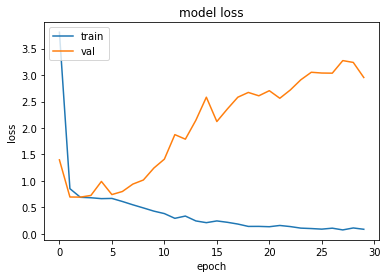

In [34]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

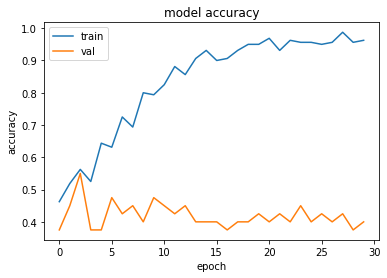

In [35]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
#So the model is overfitting again. It might me because the augmentation method is not helping the model's differentiability. And the images are still the same in terms of the lung shape.

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
prediction=model.predict(testX)
prediction = np.argmax(prediction ,axis =1)
testy=np.argmax(testY ,axis =1)
confusion_matrix = confusion_matrix(testy, prediction)

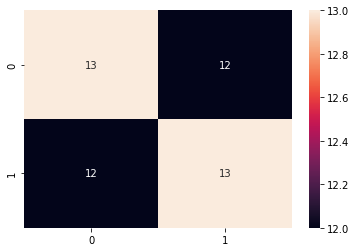

In [37]:
import seaborn as sns
sns.heatmap(confusion_matrix, annot = True)

In [39]:
scores = accuracy_score(testy, prediction)
print('The accuracy is %.2f' % (scores*100))
precision = precision_score(testy, prediction)

print('The  precision is %.2f' % (precision*100))
f1 = f1_score(testy, prediction)

print('The  f1 score is %.2f' % (f1*100))
recall= recall_score(testy, prediction)

print('The  recall score is %.2f' % (f1*100))

The accuracy is 52.00
The  precision is 52.00
The  f1 score is 52.00
The  recall score is 52.00


In [ ]:
# we can see the overfitting clearly with results we see here and in training. 

In [40]:
model = Sequential()

pretrained_model= tf.keras.applications.InceptionV3(weights="imagenet", include_top=False, input_tensor=Input(shape=(300, 300, 3)))
for layer in pretrained_model.layers:
        layer.trainable=False

model.add(pretrained_model)

In [41]:
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dense(2, activation='softmax'))

In [42]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 flatten_2 (Flatten)         (None, 131072)            0         
                                                                 
 dense_4 (Dense)             (None, 512)               67109376  
                                                                 
 dense_5 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 88,913,186
Trainable params: 67,110,402
Non-trainable params: 21,802,784
_________________________________________________________________


In [43]:
model.compile(loss='binary_crossentropy',                       # Because it is a binary classification, I use binary crossentropy for loss funtion and model will use accuracy as a metric
              optimizer=tf.keras.optimizers.Adam(lr=1e-3), # I use Adam for optimizer and set learning rate to 1e-3 after tuning period
              metrics=['accuracy'])
earlyStopping = EarlyStopping(monitor='val_loss',  # We will use early stopping to the model for preventing overfitting
                              patience = 5, # The patience value means that the model will stop if the validation loss repeats 5 times.
                              verbose = 0,
                              mode = 'auto')

callback = [
  
    [earlyStopping]
]

In [44]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 flatten_2 (Flatten)         (None, 131072)            0         
                                                                 
 dense_4 (Dense)             (None, 512)               67109376  
                                                                 
 dense_5 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 88,913,186
Trainable params: 67,110,402
Non-trainable params: 21,802,784
_________________________________________________________________


In [45]:
history=model.fit(trainX, trainY,
          validation_split=0.2, # We split the training data by 80% train and 20% validation
          batch_size=32, epochs=30, verbose=1, shuffle=True) # I choose the batch size 32  
          # Another hyperparameter is number of epechs which can be optimized with early stopping. Here I defined 30 epochs but it might stop at some point.

Epoch 1/30
5/5 [==============================] - 58s 11s/step - loss: 65.2522 - accuracy: 0.4938 - val_loss: 13.8878 - val_accuracy: 0.6250
Epoch 2/30
5/5 [==============================] - 46s 10s/step - loss: 18.7206 - accuracy: 0.4688 - val_loss: 8.9448 - val_accuracy: 0.5000
Epoch 3/30
5/5 [==============================] - 46s 10s/step - loss: 7.0277 - accuracy: 0.5688 - val_loss: 9.1764 - val_accuracy: 0.3500
Epoch 4/30
5/5 [==============================] - 46s 10s/step - loss: 3.5318 - accuracy: 0.6313 - val_loss: 3.6740 - val_accuracy: 0.5750
Epoch 5/30
5/5 [==============================] - 46s 10s/step - loss: 1.5252 - accuracy: 0.6687 - val_loss: 3.9541 - val_accuracy: 0.3750
Epoch 6/30
5/5 [==============================] - 50s 10s/step - loss: 1.0059 - accuracy: 0.7875 - val_loss: 2.3349 - val_accuracy: 0.4000
Epoch 7/30
5/5 [==============================] - 52s 11s/step - loss: 0.6180 - accuracy: 0.8125 - val_loss: 2.8181 - val_accuracy: 0.3500
Epoch 8/30
5/5 [========

In [46]:
model.summary() # we can see the model here and we can see all the layers that we defined

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 flatten_2 (Flatten)         (None, 131072)            0         
                                                                 
 dense_4 (Dense)             (None, 512)               67109376  
                                                                 
 dense_5 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 88,913,186
Trainable params: 67,110,402
Non-trainable params: 21,802,784
_________________________________________________________________


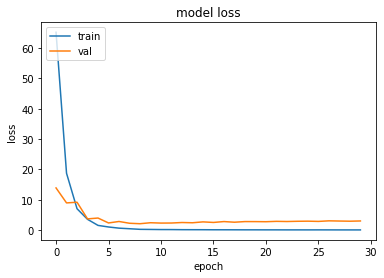

In [47]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# Train and validation losses are both decreasing and we can see that after some point the validation loss starts increasing which is an indication of the overfitting.

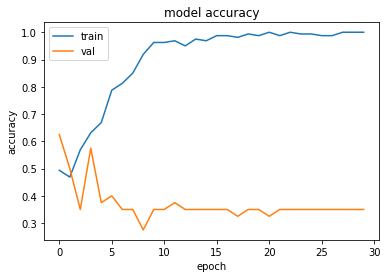

In [48]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
prediction=model.predict(testX)
prediction = np.argmax(prediction ,axis =1)
testy=np.argmax(testY ,axis =1)
confusion_matrix = confusion_matrix(testy, prediction)

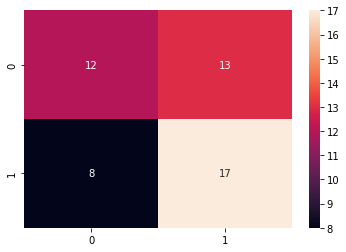

In [50]:
import seaborn as sns
sns.heatmap(confusion_matrix, annot = True)

In [52]:
scores = accuracy_score(testy, prediction)
print('The accuracy is %.2f' % (scores*100))
precision = precision_score(testy, prediction)

print('The  precision is %.2f' % (precision*100))
f1 = f1_score(testy, prediction)

print('The  f1 score is %.2f' % (f1*100))
recall= recall_score(testy, prediction)

print('The  recall score is %.2f' % (f1*100))

The accuracy is 58.00
The  precision is 56.67
The  f1 score is 61.82
The  recall score is 61.82


In [169]:
# We can see that it is overfitting from accuracy and we can confirm it with the test accuracy. As I mentioned above, although we increased the dataset, this augmentation method might not be a good solution. 
# We require a better technique like gan.  

Variational Autoencoder (VAE)

In [14]:
!pip install medmnist

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [15]:
from IPython import display

import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import tensorflow_probability as tfp
import time
from tqdm import tqdm
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchvision.transforms as transforms
import medmnist
from medmnist import INFO, Evaluator

In [16]:
# For this part we will use medical dataset from MedMNIST dataset. The dataset link is : https://medmnist.com/
# I am using chest images as it is similar to the dataset above. To download the dataset I followed the guide that can be found in: https://github.com/MedMNIST/MedMNIST/blob/main/examples/getting_started.ipynb
data_flag = 'chestmnist' 
download = True
info = INFO[data_flag]
task = info['task']
n_channels = info['n_channels']
n_classes = len(info['label'])
DataClass = getattr(medmnist, info['python_class'])

In [17]:
# Here we preproccess the data normalize it and download 
data_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[.5], std=[.5])
])

# load the data
train_dataset = DataClass(split='train', transform=data_transform, download=download)
test_dataset = DataClass(split='test', transform=data_transform, download=download)


  0%|          | 0/82802576 [00:00<?, ?it/s]

Using downloaded and verified file: /root/.medmnist/chestmnist.npz


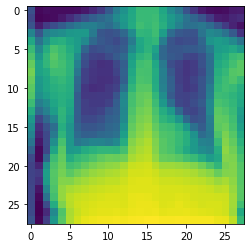

In [19]:
plt.imshow(train_dataset.imgs[0])

In [22]:
train_images=train_dataset.imgs
test_images=test_dataset.imgs

In [23]:
train_images.shape

(78468, 28, 28)

In [24]:
test_images.shape

(22433, 28, 28)

In [25]:
def preprocess_images(images):
  print(images.shape)
  images = images.reshape((images.shape[0], 28, 28, 1)) / 255.
  return np.where(images > .5, 1.0, 0.0).astype('float32')

train_images = preprocess_images(train_images)
test_images = preprocess_images(test_images)

(78468, 28, 28)
(22433, 28, 28)


In [26]:
train_size = 60000
batch_size = 32
test_size = 10000

In [27]:
train_dataset = (tf.data.Dataset.from_tensor_slices(train_images)
                 .shuffle(train_size).batch(batch_size))
test_dataset = (tf.data.Dataset.from_tensor_slices(test_images)
                .shuffle(test_size).batch(batch_size))

In [28]:
class CVAE(tf.keras.Model):
  """Convolutional variational autoencoder."""

  def __init__(self, latent_dim):
    super(CVAE, self).__init__()
    self.latent_dim = latent_dim
    self.encoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(28, 28, 1)),
            tf.keras.layers.Conv2D(
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            # No activation
            tf.keras.layers.Dense(latent_dim + latent_dim),
        ]
    )

    self.decoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
            tf.keras.layers.Dense(units=7*7*32, activation=tf.nn.relu),
            tf.keras.layers.Reshape(target_shape=(7, 7, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            # No activation
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same'),
        ]
    )

  @tf.function
  def sample(self, eps=None):
    if eps is None:
      eps = tf.random.normal(shape=(100, self.latent_dim))
    return self.decode(eps, apply_sigmoid=True)

  def encode(self, x):
    mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
    return mean, logvar

  def reparameterize(self, mean, logvar):
    eps = tf.random.normal(shape=mean.shape)
    return eps * tf.exp(logvar * .5) + mean

  def decode(self, z, apply_sigmoid=False):
    logits = self.decoder(z)
    if apply_sigmoid:
      probs = tf.sigmoid(logits)
      return probs
    return logits

In [29]:
optimizer = tf.keras.optimizers.Adam(1e-4)


def log_normal_pdf(sample, mean, logvar, raxis=1):
  log2pi = tf.math.log(2. * np.pi)
  return tf.reduce_sum(
      -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
      axis=raxis)


def compute_loss(model, x):
  mean, logvar = model.encode(x)
  z = model.reparameterize(mean, logvar)
  x_logit = model.decode(z)
  cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
  logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
  logpz = log_normal_pdf(z, 0., 0.)
  logqz_x = log_normal_pdf(z, mean, logvar)
  return -tf.reduce_mean(logpx_z + logpz - logqz_x)


@tf.function
def train_step(model, x, optimizer):
  """Executes one training step and returns the loss.

  This function computes the loss and gradients, and uses the latter to
  update the model's parameters.
  """
  with tf.GradientTape() as tape:
    loss = compute_loss(model, x)
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

In [30]:
epochs = 10
# set the dimensionality of the latent space to a plane for visualization later
latent_dim = 2
num_examples_to_generate = 16

# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(
    shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim)

In [31]:
def generate_and_save_images(model, epoch, test_sample):
  mean, logvar = model.encode(test_sample)
  z = model.reparameterize(mean, logvar)
  predictions = model.sample(z)
  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
    plt.subplot(4, 4, i + 1)
    plt.imshow(predictions[i, :, :, 0], cmap='gray')
    plt.axis('off')

  # tight_layout minimizes the overlap between 2 sub-plots
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [32]:
# Pick a sample of the test set for generating output images
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
  test_sample = test_batch[0:num_examples_to_generate, :, :, :]

In [283]:
test_sample.shape

TensorShape([16, 28, 28, 1])

Epoch: 10, Test set ELBO: -269.1640625, time elapse for current epoch: 73.83368754386902


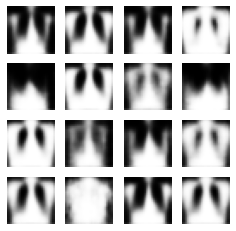

In [284]:
generate_and_save_images(model, 0, test_sample)

for epoch in range(1, epochs + 1):
  start_time = time.time()
  for train_x in train_dataset:
    train_step(model, train_x, optimizer)
  end_time = time.time()

  loss = tf.keras.metrics.Mean()
  for test_x in test_dataset:
    loss(compute_loss(model, test_x))
  elbo = -loss.result()
  display.clear_output(wait=False)
  print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
  generate_and_save_images(model, epoch, test_sample)

In [285]:
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

(-0.5, 287.5, 287.5, -0.5)

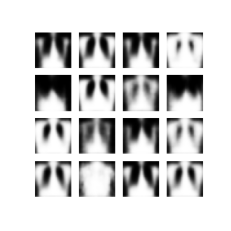

In [286]:
plt.imshow(display_image(epoch))
plt.axis('off')  # Display images

In [ ]:
# Here we can see that vae the generated images are not that great and the lung shapes differ a lot.
# Specifically for medical purposes the generated images should be as good as the real images and I think we can use gans with more confidence for that.

Generative Adversarial Networks (GANs)

In [33]:
BUFFER_SIZE = 60000
BATCH_SIZE = 256
from tensorflow.keras import layers

In [34]:
# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [35]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256)  # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 28, 28, 1)

    return model

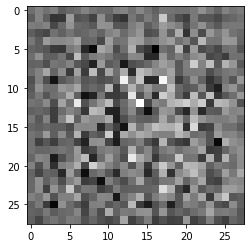

In [36]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

In [37]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

In [38]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00205044]], shape=(1, 1), dtype=float32)


In [39]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [40]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [41]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [42]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [43]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [44]:
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [45]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [46]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    # Produce images for the GIF as you go
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    # Save the model every 15 epochs
    if (epoch + 1) % 15 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  # Generate after the final epoch
  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

In [47]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')

  plt.savefig('/content/drive/My Drive/mlp/gan/gan_image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

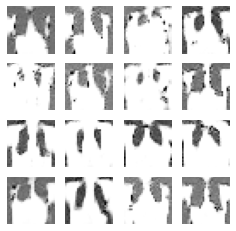

Time for epoch 22 is 996.6647794246674 sec


In [ ]:
train(train_dataset, EPOCHS)

In [10]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('/content/drive/My Drive/mlp/gan/gan_image_at_epoch_{:04d}.png'.format(epoch_no))

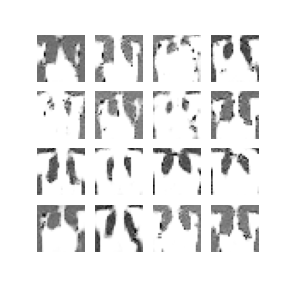

In [11]:
display_image(22)

In [ ]:
# Training GAN's take a lot of time and power. I tried to train it more but I couldn't get pass to 25 because I am using the colab. 
# The model at this stage is not getting good results but we might see more good ones in later epochs. 
# For medical images there is a variation of GAN that is designed for the medical images that usually have  small amount of images. 
# The link of the FAST-Gan is https://github.com/odegeasslbc/FastGAN-pytorch

Project progress report


Classification of Brain Tumors From MRI Images
For my project I found a dataset from kaggle which consisted 4 classes with 3 different tumors and one healthy tumorless images (link: https://www.kaggle.com/datasets/sartajbhuvaji/brain-tumor-classification-mri?select=Testing).  I trained them using CNN architecture. The CNN architecture was overfitting with training accuracy 96% and test accuracy 67%. I will use kernel regularization method as well as dropout layers to overcome the overfitting. I am planning on using transfer learning,U net and Transformers (as can be seen here: https://keras.io/examples/vision/image_classification_with_vision_transformer/) for improving the clasification. I am also planning to generate images using FastGAN model that I mentioned above. And I want to try training the models with generated images for comparision. Training the GAN model will take long time. The final goal will be comparing 4 models mentioned above and comparing performances with generated data. We will see how good GAN generates the medical data. Because the data must be as much realistic as it can be. GAN's are known to be good for producing realistic images and it is helpful with the low amount of medical data. 